## Name: Bidit Sadhukhan
## Reg.No: B2230022
## Course: ACDVL

## **Question-1**

In [3]:
import torch
x=torch.tensor([0.1,0,0.2,1],dtype=torch.float32,requires_grad=True)
z=torch.tensor([-1,1,-1,0],dtype=torch.float32,requires_grad=True)
a=x+10%4+z
b=a**(4*x)
c=(b+3)*5
y=c.mean()
y.backward()
print(x.grad)
print(z.grad)

tensor([  0.9673,   5.4931,   2.0190, 579.9380])
tensor([  0.4722,   0.0000,   0.9642, 135.0000])


## **Question-3**
### Part 3a

In [31]:
#Installing the Libraries
!pip install --upgrade --no-cache-dir gdown
!pip install optuna

In [2]:
#Loading the Dataset
!gdown 1M8BY0yFrLX3liHUOHnBTes8HMa8507BS
!unzip --qq animals.zip

Downloading...
From (original): https://drive.google.com/uc?id=1M8BY0yFrLX3liHUOHnBTes8HMa8507BS
From (redirected): https://drive.usercontent.google.com/download?id=1M8BY0yFrLX3liHUOHnBTes8HMa8507BS&confirm=t&uuid=1a240fe6-9e38-470b-aa4e-5d330dab83e5
To: /kaggle/working/animals.zip
100%|████████████████████████████████████████| 197M/197M [00:02<00:00, 75.4MB/s]


In [4]:
#Importing the libraries
import numpy as np
np.random.seed(42)
import torch
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic=True
torch.backends.cudnn.benchmark=True
from torch.utils.data import Dataset,DataLoader,Subset
from torch.utils.data.sampler import SubsetRandomSampler
import cv2
import matplotlib.pyplot as plt
import random
random.seed(42)
import torch.nn.functional as F
from sklearn.metrics import precision_score, recall_score

In [3]:
#Creating the Image dataset class
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transforms=None, unwanted_class=None):
        self.root = root_dir
        self.transforms = transforms
        # build a list of tuples (file_path, class_index)
        self.samples = []  
        self.classes = sorted(d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d)) and d != unwanted_class)
        self.class_to_idx = {classes: idx for idx, classes in enumerate(self.classes)}
        for target_class in os.listdir(self.root):
            class_index = self.class_to_idx.get(target_class)
            if class_index is not None:
                target_dir = os.path.join(self.root, target_class)
                for root, _, fnames in sorted(os.walk(target_dir, followlinks=True)):
                    for fname in sorted(fnames):
                        path = os.path.join(root, fname)
                        item = path, class_index
                        self.samples.append(item)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        image = Image.open(path).convert('RGB')
        if self.transforms is not None:
            image = self.transforms(image)
        return image, target

# For augmentation
transformer = transforms.Compose([
     transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(), # Randomly filp the image horizontally
    transforms.RandomRotation(30),  
     transforms.ToTensor(),
     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

#load dataset
dataset = CustomImageDataset('/kaggle/working/animals',transforms=transformer, unwanted_class='sample_images')

#Get the list of indices to sample from 
indices = list(range(len(dataset)))


In [4]:
np.random.seed(42)
class_indices = [[] for _ in range(len(dataset.classes))]
for i in range(len(dataset)):
    _, label = dataset[i]
    class_indices[label].append(i)

train_indices, valid_indices, test_indices = [], [], []

for class_ind in class_indices:
    np.random.shuffle(class_ind)
    
    # Modify classwise split according to your requirements
    train_end = 700
    valid_end = train_end + 100

    train_indices.extend(class_ind[:train_end])
    valid_indices.extend(class_ind[train_end:valid_end])
    test_indices.extend(class_ind[valid_end:])

torch.Generator().manual_seed(42)
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(valid_indices)
test_sampler = SubsetRandomSampler(test_indices)

torch.Generator().manual_seed(42)
train_loader = DataLoader(dataset, batch_size=64, sampler=train_sampler)
valid_loader = DataLoader(dataset, batch_size=64, sampler=valid_sampler)
test_loader = DataLoader(dataset, batch_size=64, sampler=test_sampler)

print(f"Training items: {len(train_indices)}, Validation items: {len(valid_indices)}, Testing items: {len(test_indices)}")


Training items: 2100, Validation items: 300, Testing items: 600


In [76]:
# For each class, print number of items in Train, Validation and Test dataset
train_class_count = [0]*len(dataset.classes)
valid_class_count = [0]*len(dataset.classes)
test_class_count = [0]*len(dataset.classes)

for i in train_indices:
    _, label = dataset[i]
    train_class_count[label] += 1

for i in valid_indices:
    _, label = dataset[i]
    valid_class_count[label] += 1

for i in test_indices:
    _, label = dataset[i]
    test_class_count[label] += 1

# Print the number of images for each class
for i, c in enumerate(dataset.classes):
    print(f'Class:{c}, Train count: {train_class_count[i]}, Validation count: {valid_class_count[i]}, Test count: {test_class_count[i]}')

Class:cats, Train count: 700, Validation count: 100, Test count: 200
Class:dogs, Train count: 700, Validation count: 100, Test count: 200
Class:panda, Train count: 700, Validation count: 100, Test count: 200


In [77]:
#Visualizing the dataset
np.random.seed(42)
def visualize_dataset(loader, title):
    print("="*20+ f" {title} Set " +"="*20)
    count_img = {i: 0 for i in range(len(dataset.classes))}
    fig, axs = plt.subplots(len(dataset.classes), 5, figsize=(20, 4*len(dataset.classes)))
    axs = axs.ravel()

    for images, labels in loader:
        for i, (img, label) in enumerate(zip(images, labels)):
            if all(x >= 5 for x in count_img.values()):
                break
            class_index = label.item()
            if count_img[class_index] < 5: 
                img = img.numpy().transpose((1, 2, 0)) 
                img = img * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
                img = np.clip(img, 0, 1)
                
                axs[class_index * 5 + count_img[class_index]].imshow(img)
                axs[class_index * 5 + count_img[class_index]].set_title(f'Class: {dataset.classes[class_index]} {title}')
                count_img[class_index] += 1
        if all(x >= 5 for x in count_img.values()):
            break
    plt.show()


==================== Train Dataset Set ====================


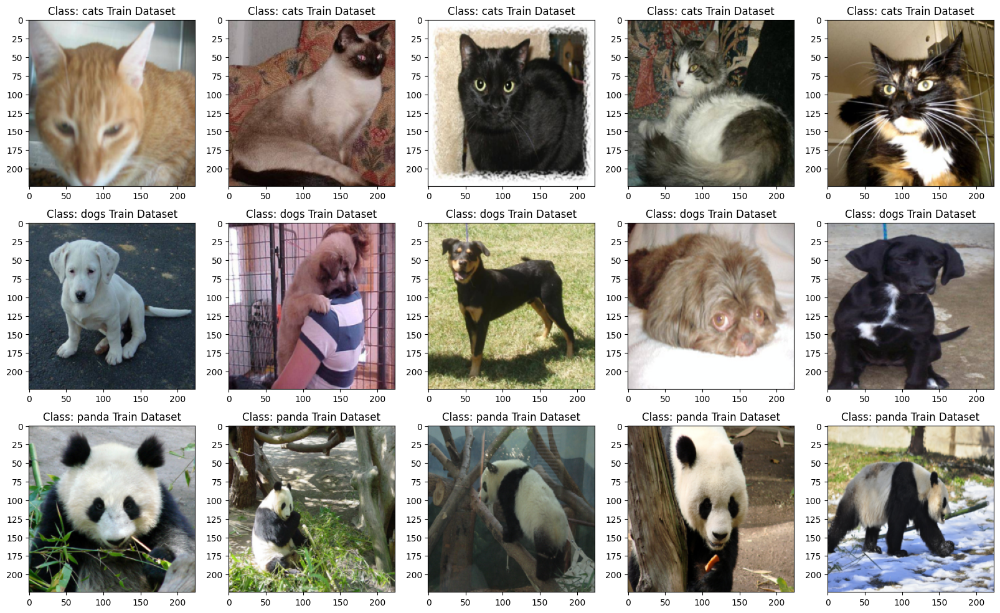

In [70]:
visualize_dataset(train_loader,title="Train Dataset")

==================== Validation Dataset Set ====================


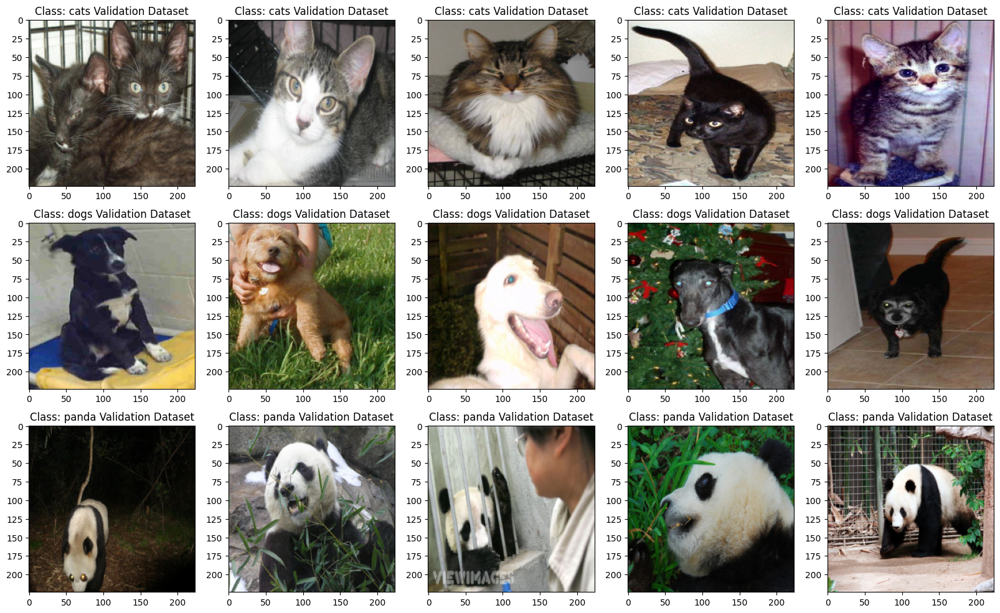

In [33]:
visualize_dataset(valid_loader,title="Validation Dataset")

==================== Test Dataset Set ====================


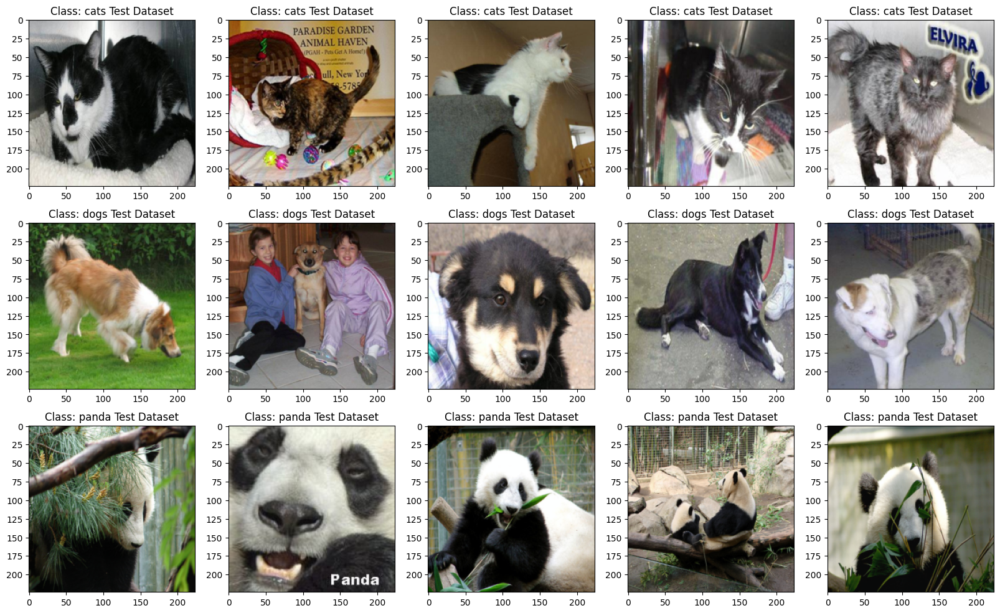

In [34]:
visualize_dataset(test_loader,title="Test Dataset")

### Part 3 b

In [ ]:
#for one hot encoding of labels
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transforms=None, unwanted_class=None):
        self.root = root_dir
        self.transforms = transforms
        # build a list of tuples (file_path, class_index)
        self.samples = []  
        self.classes = sorted(d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d)) and d != unwanted_class)
        self.class_to_idx = {classes: idx for idx, classes in enumerate(self.classes)}
        for target_class in os.listdir(self.root):
            class_index = self.class_to_idx.get(target_class)
            if class_index is not None:
                target_dir = os.path.join(self.root, target_class)
                for root, _, fnames in sorted(os.walk(target_dir, followlinks=True)):
                    for fname in sorted(fnames):
                        path = os.path.join(root, fname)
                        item = path, class_index
                        self.samples.append(item)

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        image = Image.open(path).convert('RGB')
        if self.transforms is not None:
            image = self.transforms(image)
            
        target = F.one_hot(torch.tensor(target), num_classes=3)
        return image, target

# define transforms
transformer = transforms.Compose([
     transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(), # Randomly filp the image horizontally
    transforms.RandomRotation(30),  
     transforms.ToTensor(),
     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# load dataset
dataset = CustomImageDataset('/kaggle/working/animals', transforms=transformer, unwanted_class='sample_images')

# Get the list of indices to sample from 
indices = list(range(len(dataset)))


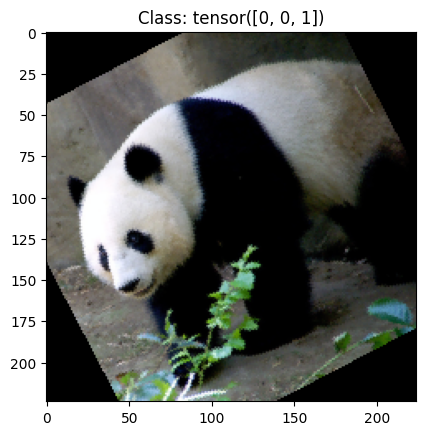

In [85]:
import matplotlib.pyplot as plt

# Take the first example in the dataset
image, target = dataset[0]

# need to rearrange the tensor dimensions to be suitable for matplotlib
image = image.numpy().transpose((1, 2, 0))

# un-normalize
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
image = std * image + mean
image = np.clip(image, 0, 1) # some values may be slightly out of bounds

plt.imshow(image)
plt.title("Class: {}".format(target))
plt.show()


### Part 3 c

In [10]:
# Basic model architecture which i used first as simple one
import torch.nn as nn

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.fc = nn.Linear(128 * 28 * 28, 3)
        
    def forward(self, x):
        x = self.conv1(x)
        x = nn.ReLU()(x)
        x = self.bn1(x)
        x = nn.MaxPool2d(2, 2)(x)
        x = self.conv2(x)
        x = nn.ReLU()(x)
        x = self.bn2(x)
        x = nn.MaxPool2d(2, 2)(x)
        x = self.conv3(x)
        x = nn.ReLU()(x)
        x = self.bn3(x)
        x = nn.MaxPool2d(2, 2)(x)
        x = x.view(x.size(0), -1)  # flatten the tensor
        x = self.fc(x)
        return x

# Initialize the model
model = CNN()
print(model)


CNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc): Linear(in_features=100352, out_features=3, bias=True)
)


In [17]:
#More developed architecture and performing good
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv_layers = nn.Sequential(
            # Conv Layer 1
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2),
            
            #Conv layer 2
            nn.Conv2d(32,64,kernel_size=3,padding=1),
            nn.BatchNorm2d(64),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2,stride=2),
            
            # Conv Layer 3
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            # Conv Layer 4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            # Conv Layer 5
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.fc_layers = nn.Sequential(
            # Fully Connected Layer 1
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(),

            # Fully Connected Layer 2
            nn.Linear(4096, 4096),
            nn.ReLU(),
 
            # Fully Connected Layer 3 (Output Layer)
            nn.Linear(4096, 3),
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)  # flatten the tensor
        x = self.fc_layers(x)
        return x

# Initialize the model
model = CNN()
print(model)

CNN(
  (conv_layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.2, inplace=False)
    (3): ReLU()
    (4): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (5): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.2, inplace=False)
    (8): ReLU()
    (9): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (10): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): Dropout(p=0.2, inplace=False)
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (16): BatchNorm2d(256, eps=

### Part 3 d
Augmentation in the dataset loading class

### Part 3 e

In [4]:
#Basic training setup as rough for improving
# Setup: initialize the criterion and optimizer
num_epochs = 30
learning_rate = 0.0007
# assuming that we are on a CUDA machine, this should print a CUDA device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



model = CNN()
model= nn.DataParallel(model)
model.to(device)
criterion = nn.CrossEntropyLoss() # It applies softmax internally, so we don't need softmax in the model
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

# Training Loop:
for epoch in range(num_epochs):
    for inputs, labels in train_loader:

        inputs = inputs.to(device)
        # labels not one hot yet, it's done on the next line
        labels = labels.to(device)

        # Forward pass
        outputs = model(inputs)
        # Convert labels to one-hot
        labels_onehot = F.one_hot(labels, num_classes=3)
        loss = criterion(outputs, torch.max(labels_onehot, 1)[1])

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print ('Epoch [{}/{}], Loss: {:.4f}' .format(epoch+1, num_epochs, loss.item()))


Epoch [1/30], Loss: 0.7399
Epoch [2/30], Loss: 0.8640
Epoch [3/30], Loss: 0.3253
Epoch [4/30], Loss: 0.1418
Epoch [5/30], Loss: 0.1544
Epoch [6/30], Loss: 0.1287
Epoch [7/30], Loss: 0.0679
Epoch [8/30], Loss: 0.0548
Epoch [9/30], Loss: 0.0354
Epoch [10/30], Loss: 0.0554
Epoch [11/30], Loss: 0.0304
Epoch [12/30], Loss: 0.0431
Epoch [13/30], Loss: 0.0263
Epoch [14/30], Loss: 0.0324
Epoch [15/30], Loss: 0.0238
Epoch [16/30], Loss: 0.0187
Epoch [17/30], Loss: 0.0236
Epoch [18/30], Loss: 0.0256
Epoch [19/30], Loss: 0.0216
Epoch [20/30], Loss: 0.0134
Epoch [21/30], Loss: 0.0152
Epoch [22/30], Loss: 0.0299
Epoch [23/30], Loss: 0.0147
Epoch [24/30], Loss: 0.0123
Epoch [25/30], Loss: 0.0095
Epoch [26/30], Loss: 0.0130
Epoch [27/30], Loss: 0.0072
Epoch [28/30], Loss: 0.0138
Epoch [29/30], Loss: 0.0188
Epoch [30/30], Loss: 0.0106


In [19]:
# Applying the precision and recall function from scikit learn
num_epochs = 30
learning_rate = 0.0007
# define the loss function
criterion = nn.CrossEntropyLoss()

for epoch in range(start_epoch, config["num_epochs"]):
    # Training phase
    model.train()
    total_train_loss = 0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Count correct predictions
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # validation phase
    model.eval()
    total_valid_loss = 0
    correct = 0
    total = 0
    valid_labels = []
    valid_preds = []
    
    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
        
            # Count correct predictions
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            valid_labels.extend(labels.detach().cpu().numpy())
            valid_preds.extend(predicted.detach().cpu().numpy())

            total_valid_loss += loss.item()
        
    valid_loss = total_valid_loss / len(valid_loader)
    valid_accuracy = correct / total
    valid_loss_list.append(valid_loss)
    valid_acc_list.append(valid_accuracy)
    
    valid_precision = precision_score(valid_labels, valid_preds, average='micro')
    valid_recall = recall_score(valid_labels, valid_preds, average='micro')

    valid_precision_list.append(valid_precision)
    valid_recall_list.append(valid_recall)

    print('Epoch [{}/{}], Training Loss: {:.4f}, Validation Loss: {:.4f}, Validation Accuracy: {:.4f}, Validation Precision: {:.4f}, Validation Recall: {:.4f}'
        .format(epoch+1, config["num_epochs"], avg_train_loss, valid_loss, valid_accuracy,valid_precision,valid_recall))
    with open("training_metrics.txt", "a") as f:
        f.write('Epoch [{}/{}], Training Loss: {:.4f}\n'
        .format(epoch+1, num_epochs, avg_train_loss))
        
    with open("validation_metrics.txt", "a") as f:
        f.write('Epoch [{}/{}], Validation Loss: {:.4f}, Validation Accuracy: {:.4f}\n'
        .format(epoch+1, num_epochs, valid_loss, valid_accuracy,valid_precision,valid_recall))
        
    # Save model checkpoint
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }
    torch.save(state, checkpoint_file)


Epoch [1/30], Training Loss: 0.0001, Validation Loss: 3.8769, Validation Accuracy: 0.6667, Validation Precision: 0.6667, Validation Recall: 0.6667
Epoch [2/30], Training Loss: 0.0001, Validation Loss: 3.8925, Validation Accuracy: 0.6533, Validation Precision: 0.6533, Validation Recall: 0.6533
Epoch [3/30], Training Loss: 0.0001, Validation Loss: 3.8031, Validation Accuracy: 0.6633, Validation Precision: 0.6633, Validation Recall: 0.6633
Epoch [4/30], Training Loss: 0.0000, Validation Loss: 4.0259, Validation Accuracy: 0.6433, Validation Precision: 0.6433, Validation Recall: 0.6433
Epoch [5/30], Training Loss: 0.0000, Validation Loss: 3.9186, Validation Accuracy: 0.6633, Validation Precision: 0.6633, Validation Recall: 0.6633
Epoch [6/30], Training Loss: 0.0002, Validation Loss: 3.7646, Validation Accuracy: 0.6600, Validation Precision: 0.6600, Validation Recall: 0.6600
Epoch [7/30], Training Loss: 0.0001, Validation Loss: 3.8144, Validation Accuracy: 0.6800, Validation Precision: 0.680

In [13]:
# Just for removing the model checkpoint
!rm -r /tmp/model_checkpoint.pt

In [22]:
#For making the model directory to save the model and the optimiser state
!mkdir /kaggle/working/model

In [14]:
# Using and mentioning hyperparameter for training and also adding the code to save the best model 
criterion=nn.CrossEntropyLoss()
# Hyperparameters
config = {
    "lr": 0.001,
    "betas": (0.9,0.999),
    "weight_decay": 0.01,
    "num_epochs": 40,
    "num_classes": 3,
    "batch_size": 128
}

config["device"] = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Check for checkpoint
start_epoch = 0
checkpoint_file = "/tmp/model_checkpoint.pt"  # Change it to your path

# Define the model
model = CNN()
model= nn.DataParallel(model)
model.to(config["device"])

# Define the optimizer
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=config["lr"],
    betas=config["betas"],
    weight_decay=config["weight_decay"]
)
# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

# Attempt to load checkpoint if needed
if os.path.isfile(checkpoint_file):
    checkpoint = torch.load(checkpoint_file)
    
    # Load the model weights
    model.load_state_dict(checkpoint['model_state_dict'])
    
    # Load the optimizer state
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    
    print("Loaded checkpoint")
else:
    print("No checkpoint found")
    
# For the  loss and the accuracy plot   
best_valid_loss = float('inf')  
train_loss_list = []
valid_loss_list = []
valid_acc_list = []

# Training + Validation loop
for epoch in range(start_epoch, config["num_epochs"]):
    # Training phase
    model.train()
    total_train_loss = 0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(config["device"])
        labels = labels.to(config["device"])

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels) 

        # Count correct predictions
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # validation phase
    model.eval()
    total_valid_loss = 0
    correct = 0
    total = 0
    valid_labels = []
    valid_preds = []

    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs = inputs.to(config["device"])
            labels = labels.to(config["device"])

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Count correct predictions
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            valid_labels.extend(labels.detach().cpu().numpy())
            valid_preds.extend(predicted.detach().cpu().numpy())

            total_valid_loss += loss.item()

    valid_loss = total_valid_loss / len(valid_loader)
    valid_accuracy = correct / total
    valid_loss_list.append(valid_loss)
    valid_acc_list.append(valid_accuracy)
    valid_precision = precision_score(valid_labels, valid_preds, average='micro')
    valid_recall = recall_score(valid_labels, valid_preds, average='micro')
    valid_precision_list.append(valid_precision)
    valid_recall_list.append(valid_recall)
    # Check if this epoch resulted in a better validation loss
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        # Save model checkpoint
        state = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'valid_loss': valid_loss
        }
        torch.save(state, '/kaggle/working/model/best.pt')

    print('Epoch [{}/{}], Training Loss: {:.4f}, Validation Loss: {:.4f}, Validation Accuracy: {:.4f}, Validation Precision: {:.4f}, Validation Recall: {:.4f}'
        .format(epoch+1, config["num_epochs"], avg_train_loss, valid_loss, valid_accuracy,valid_precision,valid_recall))
    
    with open("training_metrics.txt", "a") as f:
        f.write('Epoch [{}/{}], Training Loss: {:.4f}\n'
        .format(epoch+1, num_epochs, avg_train_loss))
        
    with open("validation_metrics.txt", "a") as f:
        f.write('Epoch [{}/{}], Validation Loss: {:.4f}, Validation Accuracy: {:.4f}\n'
        .format(epoch+1, num_epochs, valid_loss, valid_accuracy,valid_precision,valid_recall))
        
    # Save model checkpoint
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }
    torch.save(state, checkpoint_file)

No checkpoint found
Epoch [1/40], Training Loss: 11.1078, Validation Loss: 0.9824, Validation Accuracy: 0.4800, Validation Precision: 0.4800, Validation Recall: 0.4800
Epoch [2/40], Training Loss: 0.8610, Validation Loss: 0.8121, Validation Accuracy: 0.5133, Validation Precision: 0.5133, Validation Recall: 0.5133
Epoch [3/40], Training Loss: 0.7614, Validation Loss: 0.7753, Validation Accuracy: 0.5933, Validation Precision: 0.5933, Validation Recall: 0.5933
Epoch [4/40], Training Loss: 0.7299, Validation Loss: 0.7573, Validation Accuracy: 0.6267, Validation Precision: 0.6267, Validation Recall: 0.6267
Epoch [5/40], Training Loss: 0.6987, Validation Loss: 0.7294, Validation Accuracy: 0.6133, Validation Precision: 0.6133, Validation Recall: 0.6133
Epoch [6/40], Training Loss: 0.6631, Validation Loss: 0.7379, Validation Accuracy: 0.6033, Validation Precision: 0.6033, Validation Recall: 0.6033
Epoch [7/40], Training Loss: 0.6513, Validation Loss: 0.7348, Validation Accuracy: 0.6133, Valida

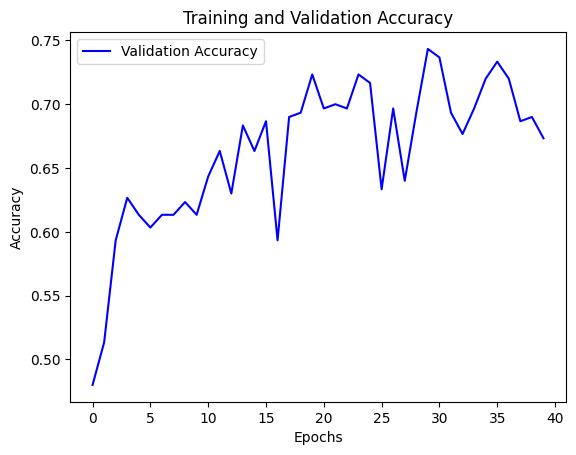

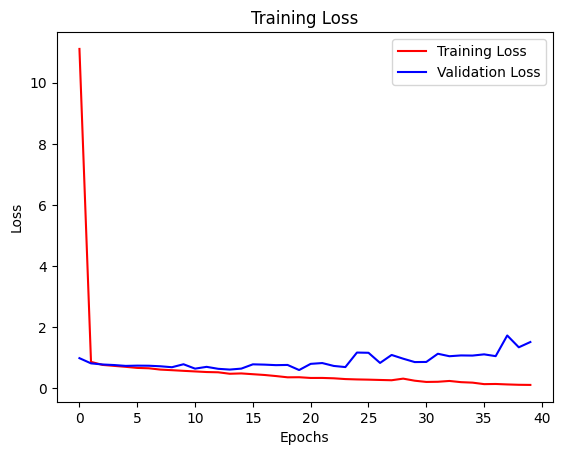

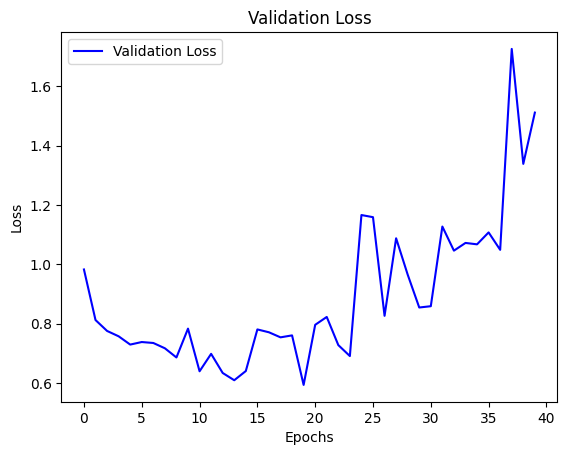

In [18]:
# For plotting the metrics basically the training and the validation loss plot
# plot accuracy
plt.figure()
plt.plot(range(40), valid_acc_list, 'b', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy.png')

# plot losses
plt.figure()
plt.plot(range(40), train_loss_list, 'r', label='Training Loss')
plt.plot(range(40), valid_loss_list, 'b', label='Validation Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('training_loss.png')

plt.figure()
plt.plot(range(40), valid_loss_list, 'b', label='Validation Loss')
plt.title("Validation Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('validation_loss.png')

### Part 3 f

In [22]:
import optuna
config["num_epochs"]=20
def objective(trial):
    
    # suggest values for the hyperparameters
    lr = trial.suggest_float("lr", 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "AdamW", "Adagrad", "RMSprop", "SGD"])
    
    model = CNN()
    model=nn.DataParallel(model)
    model.to(config["device"])
    
    # set chosen optimizer
    if optimizer_name == "Adam":
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    elif optimizer_name == "AdamW":
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    elif optimizer_name == "Adagrad":
        optimizer = torch.optim.Adagrad(model.parameters(), lr=lr)
    elif optimizer_name == "RMSprop":
        optimizer = torch.optim.RMSprop(model.parameters(), lr=lr)
    elif optimizer_name == "SGD":
        optimizer = torch.optim.SGD(model.parameters(), lr=lr)
    
    # train and validate your model then return the validation accuracy
    for epoch in range(config["num_epochs"]):
        for epoch in range(start_epoch, config["num_epochs"]):
        
            # Training phase
            model.train()
            total_train_loss = 0
            correct = 0
            total = 0
            for inputs, labels in train_loader:
                inputs = inputs.to(config["device"])
                labels = labels.to(config["device"])

                # Forward pass
                outputs = model(inputs)
                loss = criterion(outputs, labels) 

                # Count correct predictions
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                # Backward and optimize
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_train_loss += loss.item()

            avg_train_loss = total_train_loss / len(train_loader)
            train_loss_list.append(avg_train_loss)

            # validation phase
            model.eval()
            total_valid_loss = 0
            correct = 0
            total = 0
            valid_labels = []
            valid_preds = []

            with torch.no_grad():
                for inputs, labels in valid_loader:
                    inputs = inputs.to(config["device"])
                    labels = labels.to(config["device"])

                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    # Count correct predictions
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()

                    valid_labels.extend(labels.detach().cpu().numpy())
                    valid_preds.extend(predicted.detach().cpu().numpy())

                    total_valid_loss += loss.item()

            valid_loss = total_valid_loss / len(valid_loader)
            valid_accuracy = correct / total
            valid_loss_list.append(valid_loss)
            valid_acc_list.append(valid_accuracy)
            valid_precision = precision_score(valid_labels, valid_preds, average='micro')
            valid_recall = recall_score(valid_labels, valid_preds, average='micro')
            valid_precision_list.append(valid_precision)
            valid_recall_list.append(valid_recall)
           
            print('Epoch [{}/{}], Training Loss: {:.4f}, Validation Loss: {:.4f}, Validation Accuracy: {:.4f}, Validation Precision: {:.4f}, Validation Recall: {:.4f}'
                .format(epoch+1, config["num_epochs"], avg_train_loss, valid_loss, valid_accuracy,valid_precision,valid_recall))

    return valid_accuracy

           

study = optuna.create_study(direction="maximize")  # you want to maximize the accuracy
study.optimize(objective, n_trials=10)  # number of trials

# you can get the best params from the optimization
print(study.best_params)


[I 2024-03-09 15:18:41,539] A new study created in memory with name: no-name-863bb1e3-48a0-4021-8aff-de25f3ae5619


Epoch [1/20], Training Loss: 6.5357, Validation Loss: 0.9012, Validation Accuracy: 0.4833, Validation Precision: 0.4833, Validation Recall: 0.4833
Epoch [2/20], Training Loss: 0.8580, Validation Loss: 0.7854, Validation Accuracy: 0.5767, Validation Precision: 0.5767, Validation Recall: 0.5767
Epoch [3/20], Training Loss: 0.7935, Validation Loss: 0.7591, Validation Accuracy: 0.5700, Validation Precision: 0.5700, Validation Recall: 0.5700
Epoch [4/20], Training Loss: 0.7717, Validation Loss: 0.7158, Validation Accuracy: 0.6333, Validation Precision: 0.6333, Validation Recall: 0.6333
Epoch [5/20], Training Loss: 0.7138, Validation Loss: 0.7586, Validation Accuracy: 0.6167, Validation Precision: 0.6167, Validation Recall: 0.6167
Epoch [6/20], Training Loss: 0.7187, Validation Loss: 0.8531, Validation Accuracy: 0.5767, Validation Precision: 0.5767, Validation Recall: 0.5767
Epoch [7/20], Training Loss: 0.6687, Validation Loss: 0.7468, Validation Accuracy: 0.6200, Validation Precision: 0.620

[I 2024-03-09 17:19:24,488] Trial 0 finished with value: 0.7 and parameters: {'lr': 0.0008087476378100497, 'optimizer': 'AdamW'}. Best is trial 0 with value: 0.7.


Epoch [20/20], Training Loss: 0.0101, Validation Loss: 4.0283, Validation Accuracy: 0.7000, Validation Precision: 0.7000, Validation Recall: 0.7000
Epoch [1/20], Training Loss: 1.8750, Validation Loss: 0.9930, Validation Accuracy: 0.4933, Validation Precision: 0.4933, Validation Recall: 0.4933
Epoch [2/20], Training Loss: 0.7383, Validation Loss: 0.6838, Validation Accuracy: 0.7033, Validation Precision: 0.7033, Validation Recall: 0.7033
Epoch [3/20], Training Loss: 0.6377, Validation Loss: 0.7022, Validation Accuracy: 0.6567, Validation Precision: 0.6567, Validation Recall: 0.6567
Epoch [4/20], Training Loss: 0.6130, Validation Loss: 0.6445, Validation Accuracy: 0.6733, Validation Precision: 0.6733, Validation Recall: 0.6733
Epoch [5/20], Training Loss: 0.5342, Validation Loss: 0.6205, Validation Accuracy: 0.6900, Validation Precision: 0.6900, Validation Recall: 0.6900
Epoch [6/20], Training Loss: 0.4927, Validation Loss: 0.6216, Validation Accuracy: 0.7100, Validation Precision: 0.71

[W 2024-03-09 17:22:32,950] Trial 1 failed with parameters: {'lr': 2.6018862850488234e-05, 'optimizer': 'RMSprop'} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "/tmp/ipykernel_34/2248579462.py", line 34, in objective
    for inputs, labels in train_loader:
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 630, in __next__
    data = self._next_data()
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 674, in _next_data
    data = self._dataset_fetcher.fetch(index)  # may raise StopIteration
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/_utils/fetch.py", line 51, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/_utils/fetch.py", 

KeyboardInterrupt: 

### Part 3 i

In [15]:
from sklearn.metrics import classification_report

saved_model='/kaggle/working/model/best.pt'
correct_examples = defaultdict(list)
# Attempt to load checkpoint if needed
if os.path.isfile(saved_model):
    checkpoint = torch.load(saved_model)
    
    # Load the model weights
    model.load_state_dict(checkpoint['model_state_dict'])
    
    # Load the optimizer state
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    
    print("Loaded checkpoint")
else:
    print("No checkpoint found")
# Set the model to evaluation mode
model.eval()

# Placeholder for our predictions and labels
all_preds = []
all_labels = []

# Don't calculate gradients, we're just doing forward passes
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(config["device"])
        labels = labels.to(config["device"])

        # Forward pass
        outputs = model(inputs)

        # Retrieve the predictions and the ground truth labels
        _, preds = torch.max(outputs, 1)
        
        # Add to our lists
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        

# Print classification report
print(classification_report(all_labels, all_preds, target_names=['cats', 'dogs', 'panda']))


Loaded checkpoint
              precision    recall  f1-score   support

        cats       0.69      0.66      0.68       200
        dogs       0.63      0.68      0.65       200
       panda       0.91      0.87      0.89       200

    accuracy                           0.74       600
   macro avg       0.74      0.74      0.74       600
weighted avg       0.74      0.74      0.74       600



### Part 3 h

Loaded checkpoint
              precision    recall  f1-score   support

        cats       0.69      0.66      0.68       200
        dogs       0.63      0.68      0.65       200
       panda       0.91      0.87      0.89       200

    accuracy                           0.74       600
   macro avg       0.74      0.74      0.74       600
weighted avg       0.74      0.74      0.74       600

Showing panda images...


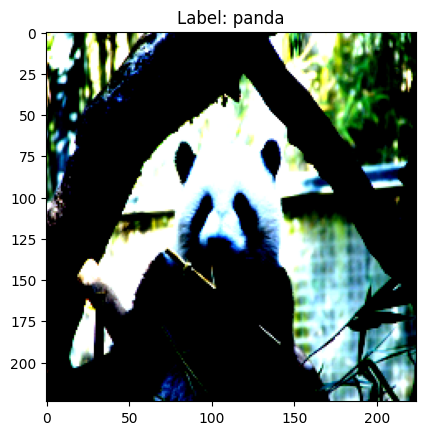

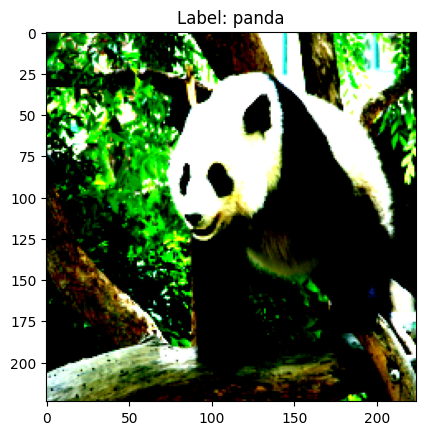

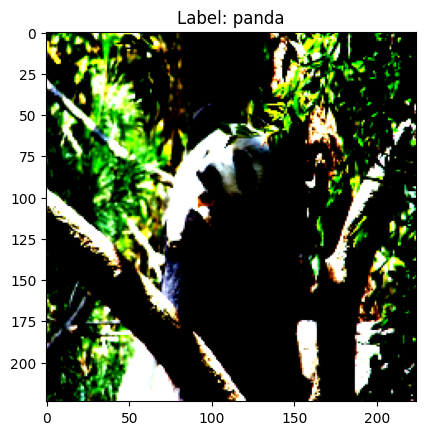

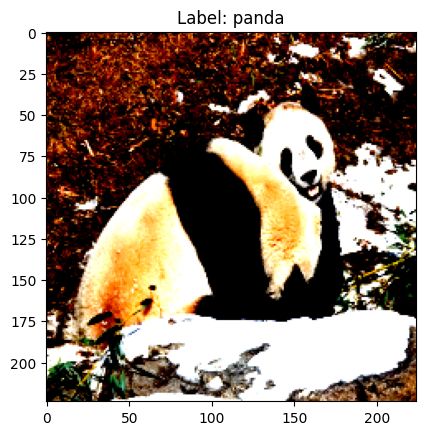

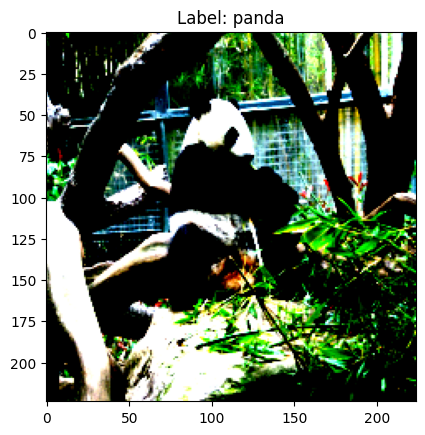

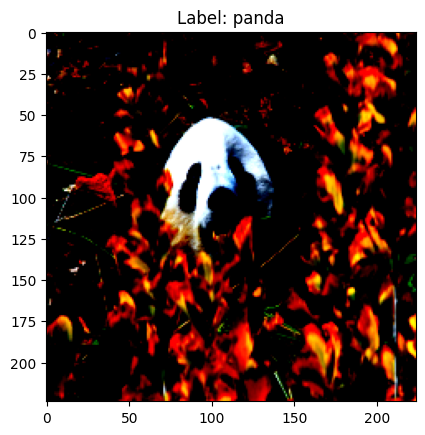

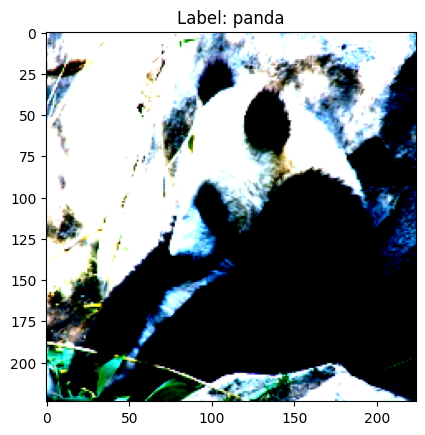

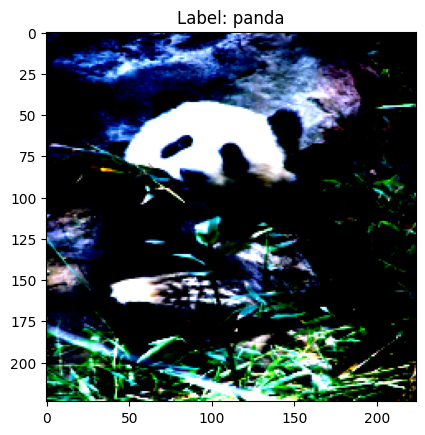

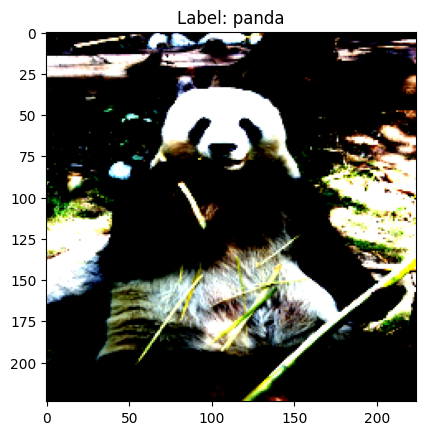

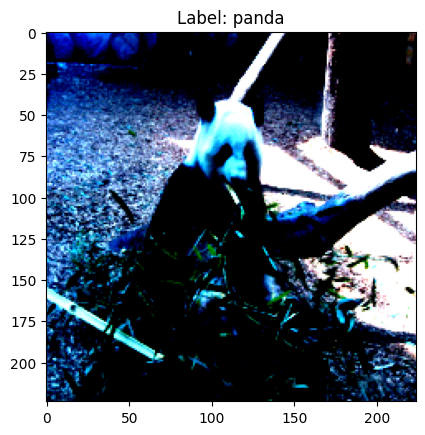

Showing cats images...


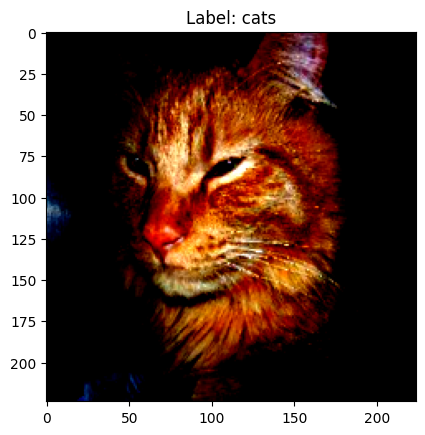

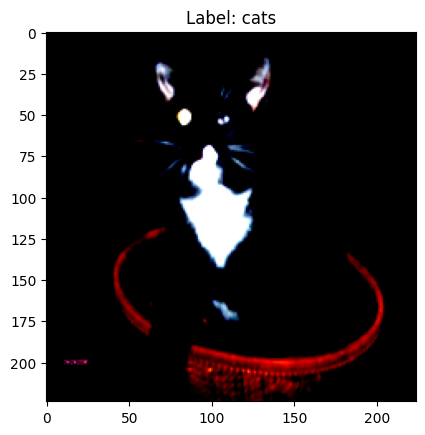

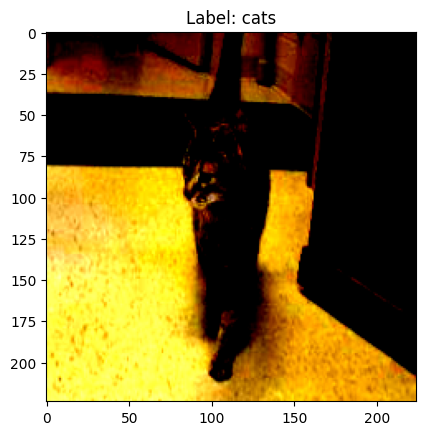

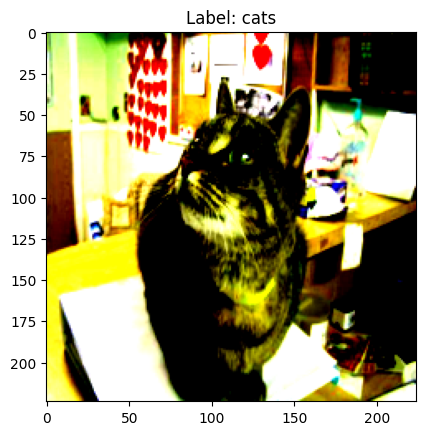

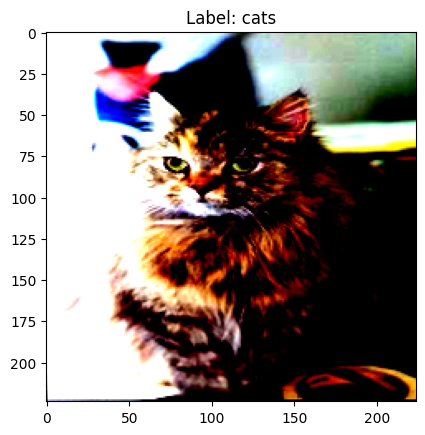

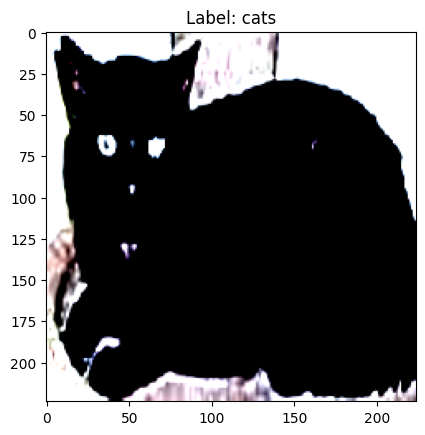

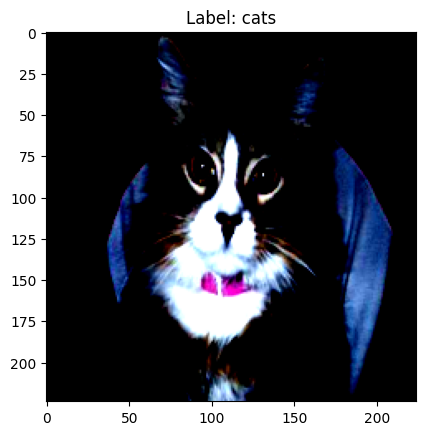

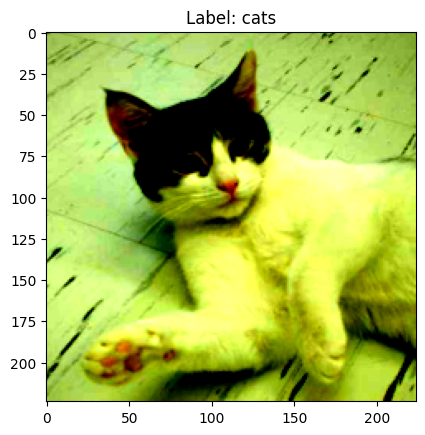

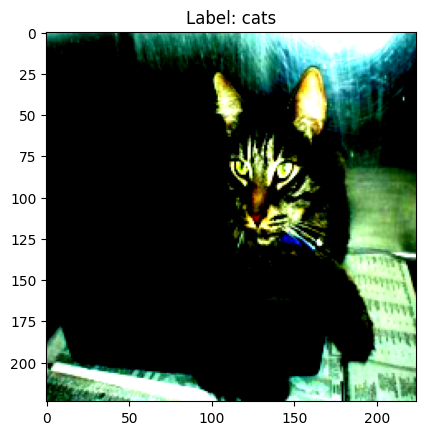

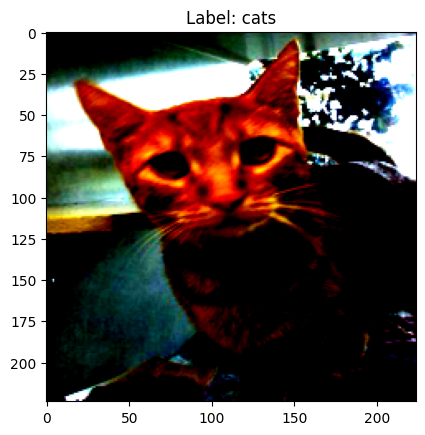

Showing dogs images...


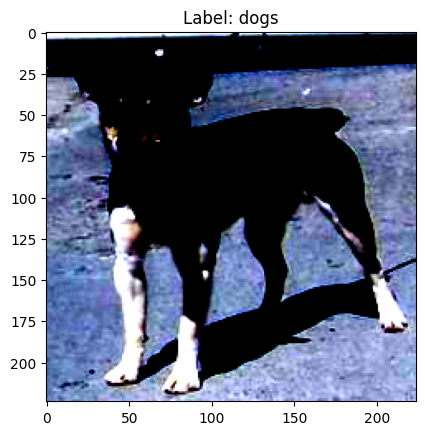

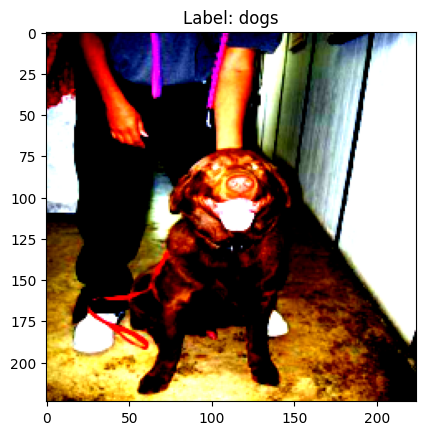

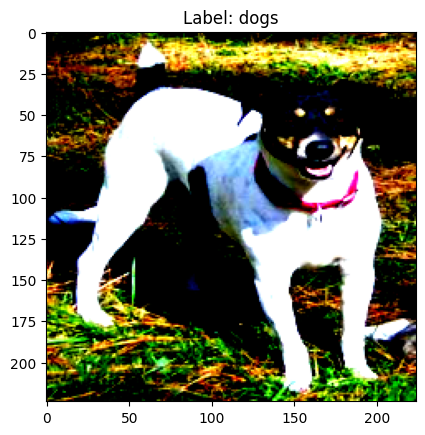

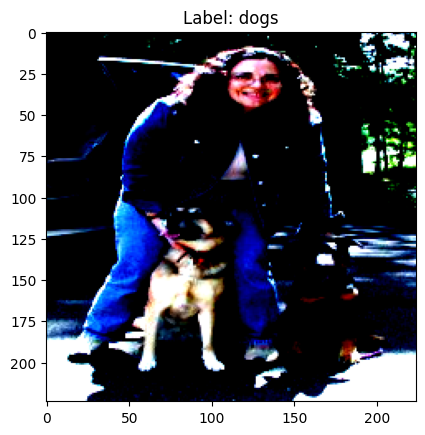

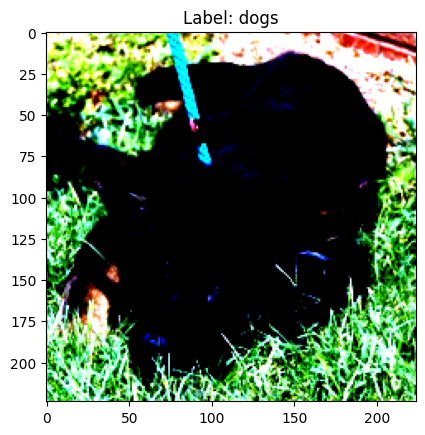

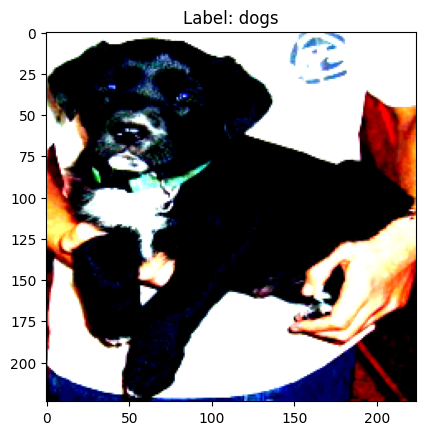

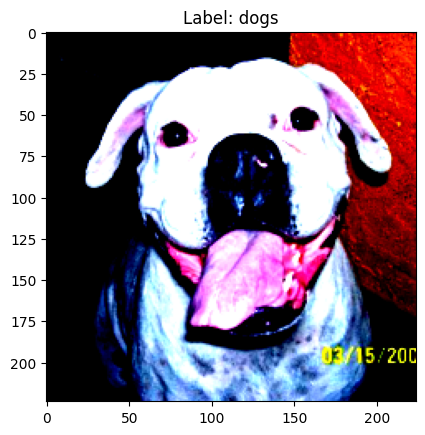

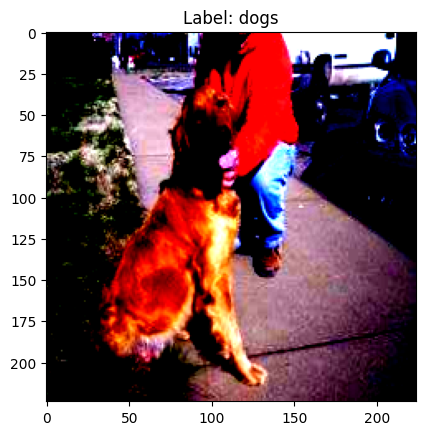

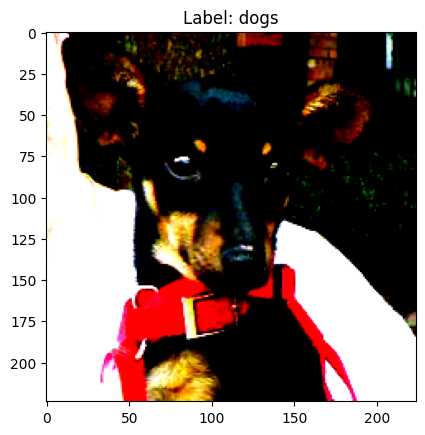

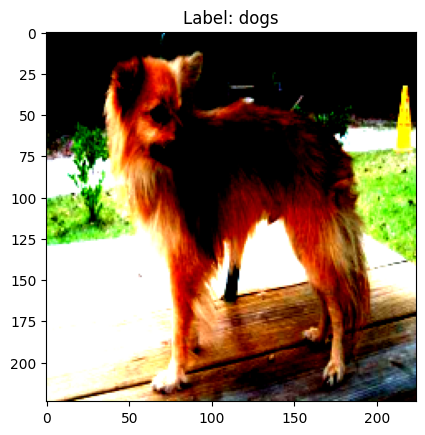

In [20]:
from sklearn.metrics import classification_report
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np

correct_examples = defaultdict(list)

saved_model='/kaggle/working/model/best.pt'

# Attempt to load checkpoint if needed
if os.path.isfile(saved_model):
    checkpoint = torch.load(saved_model)

    # Load the model weights
    model.load_state_dict(checkpoint['model_state_dict'])

    # Load the optimizer state
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    print("Loaded checkpoint")
else:
    print("No checkpoint found")

# Set the model to evaluation mode
model.eval()

# Placeholder for our predictions and labels
all_preds = []
all_labels = []

# Don't calculate gradients, we're just doing forward passes
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(config["device"])
        labels = labels.to(config["device"])

        # Forward pass
        outputs = model(inputs)

        # Retrieve the predictions and the ground truth labels
        _, preds = torch.max(outputs, 1)
       
        # Add to our lists
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        # Check for correctly classified examples
        correct = preds.eq(labels)
        for img, lbl in zip(inputs[correct], labels[correct]):
            correct_examples[lbl.item()].append(img.cpu().numpy())

# Print classification report
print(classification_report(all_labels, all_preds, target_names=['cats', 'dogs', 'panda']))

# Let's visualize some of the correctly classified examples for each class
num_examples = 10  # Let's show up to 10 examples
labels_names = ['cats', 'dogs', 'panda']

for label, images in correct_examples.items():
    print(f"Showing {labels_names[label]} images...")
    for i in range(min(len(images), num_examples)):
        img = images[i] 
        img = np.transpose(img, (1, 2, 0))  # Change shape from [C,H,W] to [H,W,C]
        plt.imshow(img)
        plt.title(f'Label: {labels_names[label]}')
        plt.show()


### Part 3 g j

Showing misclassified dogs images...


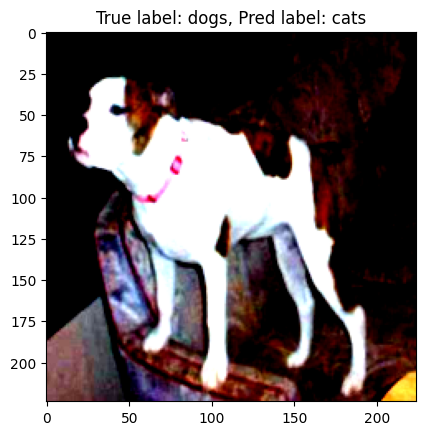

Softmax scores: [8.3095634e-01 1.6903400e-01 9.6764661e-06]


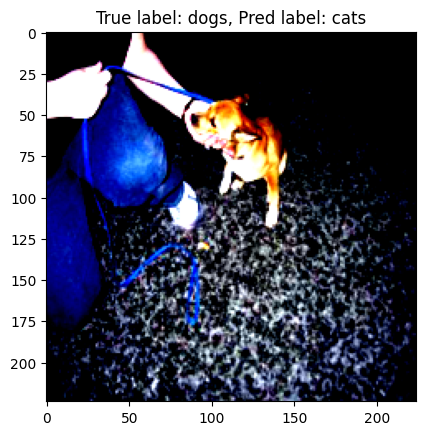

Softmax scores: [0.9877693  0.00991292 0.00231786]


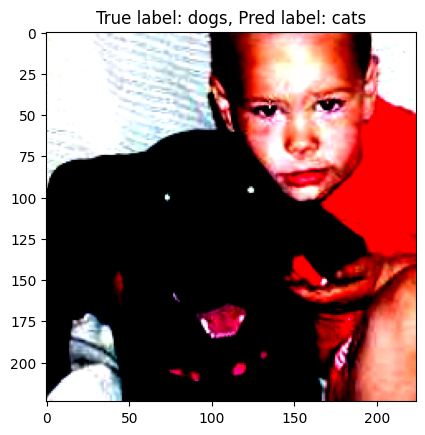

Softmax scores: [9.9885046e-01 1.1444185e-03 5.1208995e-06]


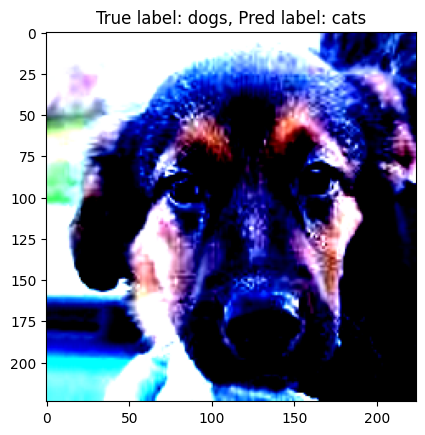

Softmax scores: [9.2453903e-01 7.5428598e-02 3.2383257e-05]


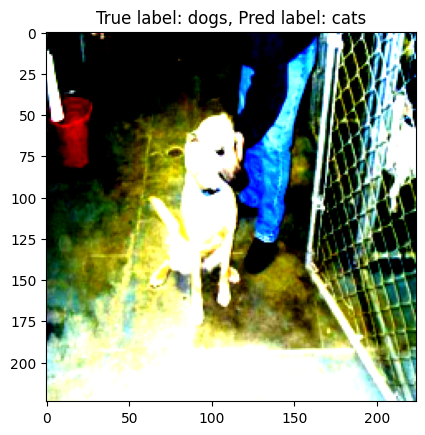

Softmax scores: [0.73018473 0.18078534 0.08902996]
Showing misclassified cats images...


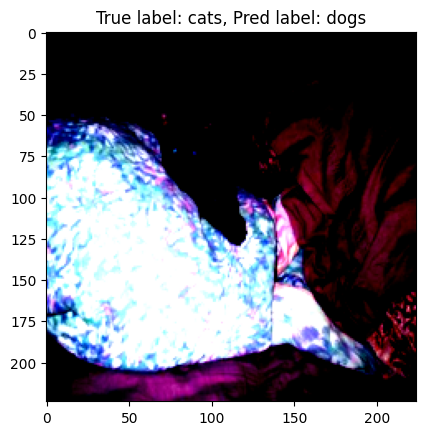

Softmax scores: [2.96279550e-01 7.03605652e-01 1.14777504e-04]


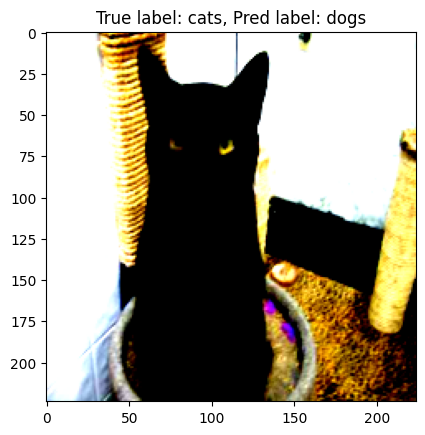

Softmax scores: [0.44681194 0.5486651  0.00452289]


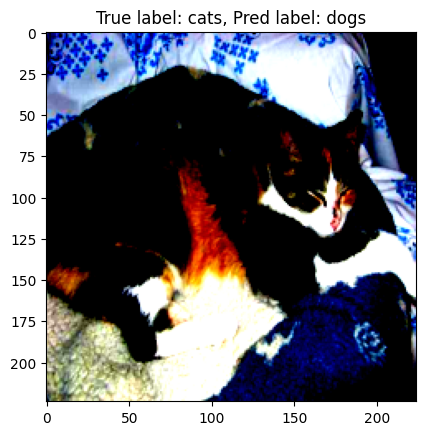

Softmax scores: [4.1495743e-03 9.9521905e-01 6.3136587e-04]


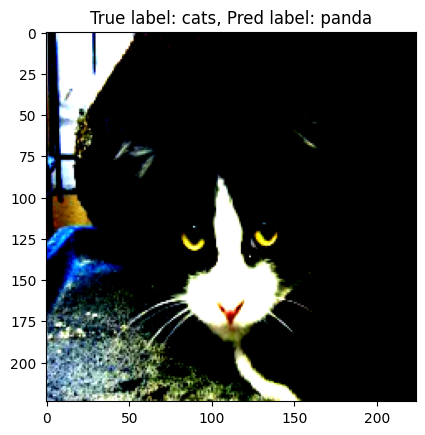

Softmax scores: [0.28818274 0.00223504 0.70958227]


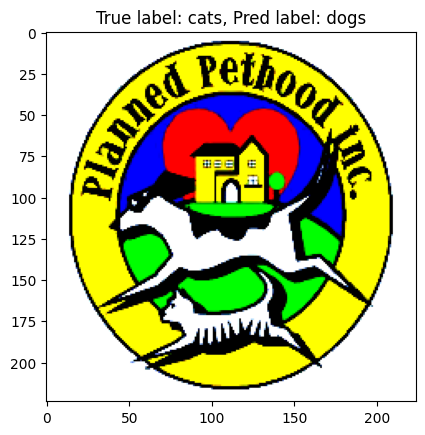

Softmax scores: [5.4744977e-08 9.9999321e-01 6.7458054e-06]
Showing misclassified panda images...


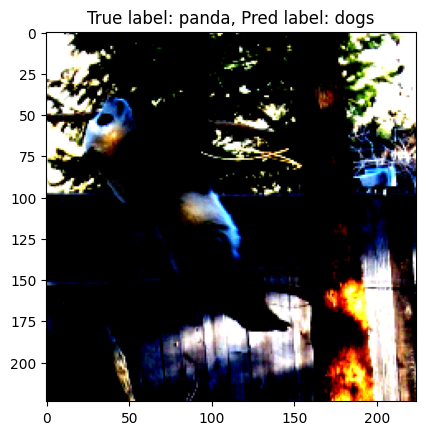

Softmax scores: [1.1177805e-04 9.9399078e-01 5.8974479e-03]


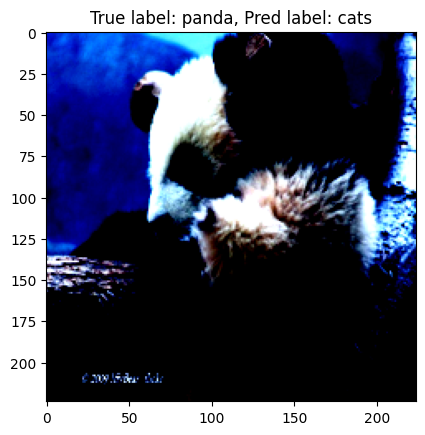

Softmax scores: [9.086887e-01 9.128984e-02 2.147324e-05]


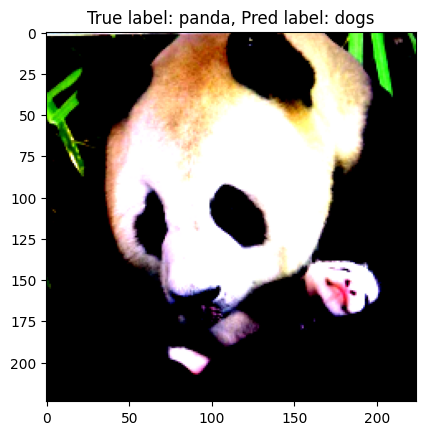

Softmax scores: [0.00707702 0.97732884 0.01559415]


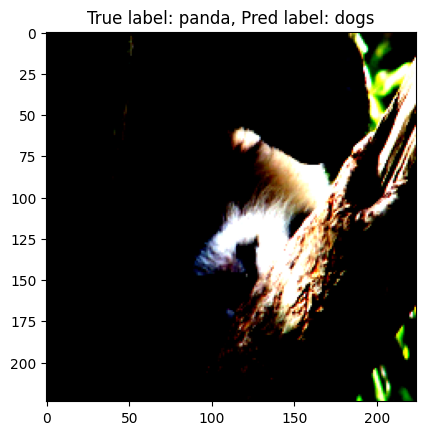

Softmax scores: [1.1620870e-02 9.8837751e-01 1.5979319e-06]


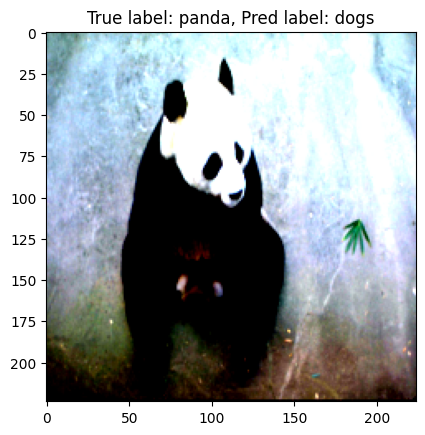

Softmax scores: [0.00611951 0.917789   0.07609151]


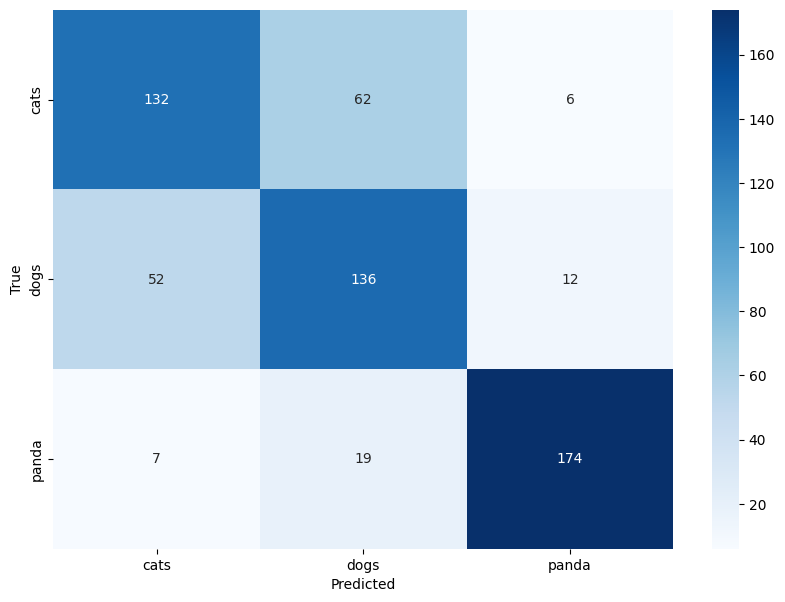

In [21]:
#Ploting the code for the misclassified examples
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Placeholder for misclassified examples
misclassified_examples = defaultdict(list)

# Obtain the misclassified images
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(config["device"])
        labels = labels.to(config["device"])

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        incorrect = preds.ne(labels)
        softmax_scores = torch.nn.functional.softmax(outputs, dim=1)
        for img, true_lbl, pred_lbl, scores in zip(
            inputs[incorrect], labels[incorrect], preds[incorrect], softmax_scores[incorrect]
        ):
            misclassified_examples[true_lbl.item()].append((img.cpu().numpy(), pred_lbl.item(), scores.cpu().numpy()))

# Display misclassified examples
for label, examples in misclassified_examples.items():
    print(f"Showing misclassified {labels_names[label]} images...")
    for i in range(min(len(examples), 5)):
        img, pred, scores = examples[i]
        img = np.transpose(img, (1, 2, 0))
        plt.imshow(img)
        plt.title(f'True label: {labels_names[label]}, Pred label: {labels_names[pred]}')
        plt.show()
        print(f"Softmax scores: {scores}")

# Create confusion matrix based on validation dataset
y_true = np.array(all_labels)
y_pred = np.array(all_preds)
cm = confusion_matrix(y_true, y_pred)

# Display confusion matrix using seaborn
plt.figure(figsize = (10,7))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=labels_names, yticklabels=labels_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


In [23]:
# Using and mentioning hyperparameter for training and also adding the code to save the best model 
criterion=nn.NLLLoss()
# Hyperparameters
config = {
    "lr": 0.001,
    "betas": (0.9,0.999),
    "weight_decay": 0.01,
    "num_epochs": 40,
    "num_classes": 3,
    "batch_size": 128
}

config["device"] = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# Define the model
model = CNN()
model= nn.DataParallel(model)
model.to(config["device"])

# Define the optimizer
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=config["lr"],
    betas=config["betas"],
    weight_decay=config["weight_decay"]
)
# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)


best_valid_loss = float('inf')    
# Training + Validation loop
for epoch in range(start_epoch, config["num_epochs"]):
    # Training phase
    model.train()
    total_train_loss = 0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(config["device"])
        labels = labels.to(config["device"])

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels) 

        # Count correct predictions
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item()

    avg_train_loss = total_train_loss / len(train_loader)
    train_loss_list.append(avg_train_loss)

    # validation phase
    model.eval()
    total_valid_loss = 0
    correct = 0
    total = 0
    valid_labels = []
    valid_preds = []

    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs = inputs.to(config["device"])
            labels = labels.to(config["device"])

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Count correct predictions
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            valid_labels.extend(labels.detach().cpu().numpy())
            valid_preds.extend(predicted.detach().cpu().numpy())

            total_valid_loss += loss.item()

    valid_loss = total_valid_loss / len(valid_loader)
    valid_accuracy = correct / total
    valid_loss_list.append(valid_loss)
    valid_acc_list.append(valid_accuracy)
    valid_precision = precision_score(valid_labels, valid_preds, average='micro')
    valid_recall = recall_score(valid_labels, valid_preds, average='micro')
    valid_precision_list.append(valid_precision)
    valid_recall_list.append(valid_recall)
    # Check if this epoch resulted in a better validation loss
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        # Save model checkpoint
        state = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'valid_loss': valid_loss
        }
        torch.save(state, '/kaggle/working/model/best_loss.pt')

    print('Epoch [{}/{}], Training Loss: {:.4f}, Validation Loss: {:.4f}, Validation Accuracy: {:.4f}, Validation Precision: {:.4f}, Validation Recall: {:.4f}'
        .format(epoch+1, config["num_epochs"], avg_train_loss, valid_loss, valid_accuracy,valid_precision,valid_recall))
    
   
    # Save model checkpoint
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }
    torch.save(state, checkpoint_file)

Epoch [1/40], Training Loss: -1197973.2728, Validation Loss: -5792609.8000, Validation Accuracy: 0.3333, Validation Precision: 0.3333, Validation Recall: 0.3333
Epoch [2/40], Training Loss: -36249786.3030, Validation Loss: -94310475.2000, Validation Accuracy: 0.3333, Validation Precision: 0.3333, Validation Recall: 0.3333
Epoch [3/40], Training Loss: -267382886.0606, Validation Loss: -564262937.6000, Validation Accuracy: 0.3333, Validation Precision: 0.3333, Validation Recall: 0.3333
Epoch [4/40], Training Loss: -1062177375.0303, Validation Loss: -1830434304.0000, Validation Accuracy: 0.3333, Validation Precision: 0.3333, Validation Recall: 0.3333
Epoch [5/40], Training Loss: -3013319885.5758, Validation Loss: -4524713676.8000, Validation Accuracy: 0.3333, Validation Precision: 0.3333, Validation Recall: 0.3333
Epoch [6/40], Training Loss: -6938028249.2121, Validation Loss: -10178168422.4000, Validation Accuracy: 0.3333, Validation Precision: 0.3333, Validation Recall: 0.3333
Epoch [7/